<a href="https://colab.research.google.com/github/nazlicanalagoz/VeriAnalizi_Proje/blob/main/bikestore_salesdata.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install

In [ ]:
!pip install pandas-profiling==3.4.0

In [ ]:
!pip install prettypandas

In [ ]:
!pip install datacleaner

In [ ]:
!pip install datasets

In [ ]:
!pip install vaex

In [ ]:
!pip install dataprep

In [ ]:
!pip install "dask[complete]"

In [ ]:
!pip install sweetviz

In [ ]:
!pip install pandas_bokeh 

In [ ]:
!pip install dora

# Kütüphaneler

In [ ]:
import pandas as pd   # pandas kütüphanesi çağırıldı
import numpy as np #numpy kütüphanesi çağırıldı
import matplotlib   # matplotlib kütüphanesi çağırıldı
import seaborn as sns   # seaborn kütüphanesi çağırıldı
import matplotlib.pyplot as plt
import keras   # keras kütüphanesi çağırıldı
import sys    # sistem import edildi

import sweetviz as sv   # sweetviz kütüphanesi çağırıldı

from Dora import Dora  # dora kütüphanesi çağırılıp import edildi

import pandas_bokeh   # bokeh kütüphanesi importlandı
from bokeh.layouts import row
from bokeh.io import show, output_notebook
from bokeh.plotting import figure, show
pandas_bokeh.output_notebook()
pd.set_option('plotting.backend', 'pandas_bokeh')

import dask
import dask.dataframe as dd  # dask kütüphanesi importlandı

import vaex   # vaex kütüphanesi import edildi.

from datasets import Dataset  # dataset kütüphanesi importlandı
from dataprep.eda import plot_correlation    # dataprep için gereken kütüphaneler çağırıldı
from dataprep.datasets import load_dataset
from dataprep.eda import plot

from prettypandas import PrettyPandas  # Prettypandas kütüphanesi çağırıldı

import datacleaner   #datacleaner kütüphanesi çağırıldı
from datacleaner import autoclean

import ProfileReport
import pandas_profiling  # pandas_profiling kütüphanesi import edildi
from pandas_profiling import ProfileReport  # pandas_profiling kütüphanesinden profil raporlama çağırıldı

In [38]:
# 3
print("Pandas versiyonu: {}".format(pd.__version__))  # Pandas kütüphanesi versiyonu bulundu.
# 5
print("Python versiyonu: {}".format(sys.version))  # Python sistem versiyonu bulundu.
# 37
print("Matplotlib versiyonu: {}".format(matplotlib.__version__))  # Matplotlib kütüphanesi versiyonu bulundu.
# 60
print("Keras versiyonu: {}".format(keras.__version__))  # keras kütüphanesi versiyonu bulundu.

Pandas versiyonu: 1.3.5
Python versiyonu: 3.8.16 (default, Dec  7 2022, 01:12:13) 
[GCC 7.5.0]
Matplotlib versiyonu: 3.2.2
Keras versiyonu: 2.9.0


In [4]:
# 1
ALAGOZ_DF = pd.read_csv('https://raw.githubusercontent.com/nazlicanalagoz/VeriAnalizi_Proje/main/sales_data.csv', parse_dates=['Date'])  # veri setini okuduk

# Temel İşlemler

In [5]:
# 2
ALAGOZ_DF.info()  # Özet bilgiler gösterildi.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113036 entries, 0 to 113035
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Date              113036 non-null  datetime64[ns]
 1   Day               113036 non-null  int64         
 2   Month             113036 non-null  object        
 3   Year              113036 non-null  int64         
 4   Customer_Age      113036 non-null  int64         
 5   Age_Group         113036 non-null  object        
 6   Customer_Gender   113036 non-null  object        
 7   Country           113036 non-null  object        
 8   State             113036 non-null  object        
 9   Product_Category  113036 non-null  object        
 10  Sub_Category      113036 non-null  object        
 11  Product           113036 non-null  object        
 12  Order_Quantity    113036 non-null  int64         
 13  Unit_Cost         113036 non-null  int64         
 14  Unit

In [6]:
# 6
ALAGOZ_DF.head()   # ilk 5 veri çağırıldı.

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418


In [7]:
# 7
ALAGOZ_DF.tail()   # son 5 veri çağırıldı.

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
113031,2016-04-12,12,April,2016,41,Adults (35-64),M,United Kingdom,England,Clothing,Vests,"Classic Vest, S",3,24,64,112,72,184
113032,2014-04-02,2,April,2014,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113033,2016-04-02,2,April,2016,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113034,2014-03-04,4,March,2014,37,Adults (35-64),F,France,Seine (Paris),Clothing,Vests,"Classic Vest, L",24,24,64,684,576,1260
113035,2016-03-04,4,March,2016,37,Adults (35-64),F,France,Seine (Paris),Clothing,Vests,"Classic Vest, L",23,24,64,655,552,1207


In [8]:
# 8
ALAGOZ_DF.tail(-1)  # bütün veriler çağırıldı.

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418
5,2016-05-15,15,May,2016,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,5,45,120,297,225,522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113031,2016-04-12,12,April,2016,41,Adults (35-64),M,United Kingdom,England,Clothing,Vests,"Classic Vest, S",3,24,64,112,72,184
113032,2014-04-02,2,April,2014,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113033,2016-04-02,2,April,2016,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113034,2014-03-04,4,March,2014,37,Adults (35-64),F,France,Seine (Paris),Clothing,Vests,"Classic Vest, L",24,24,64,684,576,1260


In [9]:
# 51
ALAGOZ_DF.sample(5)   # 5 veriyi rastgele listeledik.

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
74114,2014-06-10,10,June,2014,29,Young Adults (25-34),F,Germany,Bayern,Clothing,Socks,"Racing Socks, L",27,3,9,160,81,241
36028,2013-08-15,15,August,2013,24,Youth (<25),F,United States,California,Accessories,Helmets,"Sport-100 Helmet, Blue",2,13,35,43,26,69
80685,2013-08-06,6,August,2013,24,Youth (<25),M,Germany,Saarland,Accessories,Tires and Tubes,Patch Kit/8 Patches,2,1,2,1,2,3
92416,2014-05-05,5,May,2014,37,Adults (35-64),F,Germany,Hessen,Accessories,Tires and Tubes,Road Tire Tube,6,1,4,16,6,22
71000,2012-12-20,20,December,2012,43,Adults (35-64),M,United States,California,Bikes,Road Bikes,"Road-150 Red, 48",2,2171,3578,2671,4342,7013


In [10]:
# 12
ALAGOZ_DF.size  # toplam veri sayısı

2034648

In [11]:
# 9
print(ALAGOZ_DF.select_dtypes (include='number'))  # sayısal alanlar çağırıldı.

        Day  Year  Customer_Age  Order_Quantity  Unit_Cost  Unit_Price  \
0        26  2013            19               8         45         120   
1        26  2015            19               8         45         120   
2        23  2014            49              23         45         120   
3        23  2016            49              20         45         120   
4        15  2014            47               4         45         120   
...     ...   ...           ...             ...        ...         ...   
113031   12  2016            41               3         24          64   
113032    2  2014            18              22         24          64   
113033    2  2016            18              22         24          64   
113034    4  2014            37              24         24          64   
113035    4  2016            37              23         24          64   

        Profit  Cost  Revenue  
0          590   360      950  
1          590   360      950  
2         1366 

In [12]:
# 10
print(ALAGOZ_DF['State'].value_counts())   # sayısal olmayan bir alanın frekans dağılımı analiz edildi.

California             22450
British Columbia       14116
England                13620
Washington             11264
New South Wales        10412
Victoria                6016
Oregon                  5286
Queensland              5220
Saarland                2770
Nordrhein-Westfalen     2484
Hessen                  2384
Seine (Paris)           2328
Hamburg                 1836
Seine Saint Denis       1684
Nord                    1670
South Australia         1564
Bayern                  1426
Hauts de Seine          1084
Essonne                  994
Yveline                  954
Tasmania                 724
Seine et Marne           394
Moselle                  386
Loiret                   382
Val d'Oise               264
Garonne (Haute)          208
Brandenburg              198
Val de Marne             158
Charente-Maritime        148
Somme                    134
Loir et Cher             120
Pas de Calais             90
Alberta                   56
Texas                     30
Ohio          

In [13]:
# 13
len(ALAGOZ_DF.columns)  # toplam sütun sayısı

18

In [14]:
# 14
print(ALAGOZ_DF.columns)  # sütun isimleri

Index(['Date', 'Day', 'Month', 'Year', 'Customer_Age', 'Age_Group',
       'Customer_Gender', 'Country', 'State', 'Product_Category',
       'Sub_Category', 'Product', 'Order_Quantity', 'Unit_Cost', 'Unit_Price',
       'Profit', 'Cost', 'Revenue'],
      dtype='object')


# Eksik Veriler ve Tekrarlı Veriler

In [15]:
# 15
ALAGOZ_DF[ALAGOZ_DF.isnull().any(axis=1)]   # veri setindeki eksik veriler çekildi

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue


In [16]:
# 16
ALAGOZ_DF.isnull().sum() # sütunlardaki eksik veri sayısı bulundu

Date                0
Day                 0
Month               0
Year                0
Customer_Age        0
Age_Group           0
Customer_Gender     0
Country             0
State               0
Product_Category    0
Sub_Category        0
Product             0
Order_Quantity      0
Unit_Cost           0
Unit_Price          0
Profit              0
Cost                0
Revenue             0
dtype: int64

In [17]:
# 17
ALAGOZ_DF.isna().sum().sum() # Bütun sütunlardaki toplam eksik veri sayısı

0

In [18]:
# 18
ALAGOZ_DF.fillna(0)  # eksik verilerin yerine "0-sıfır" yazıldı.

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113031,2016-04-12,12,April,2016,41,Adults (35-64),M,United Kingdom,England,Clothing,Vests,"Classic Vest, S",3,24,64,112,72,184
113032,2014-04-02,2,April,2014,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113033,2016-04-02,2,April,2016,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113034,2014-03-04,4,March,2014,37,Adults (35-64),F,France,Seine (Paris),Clothing,Vests,"Classic Vest, L",24,24,64,684,576,1260


In [19]:
# 19
ALAGOZ_DF = ALAGOZ_DF.dropna()   # veri setinden eksik veriler çıkarıldı.

In [20]:
# 20
ALAGOZ_DF.duplicated().sum()   # Tekrarlı verilerin sayısı

1000

# Veri Tipi ve Class Sorgulama

In [21]:
# 23
print(ALAGOZ_DF['Age_Group'].dtypes)   # Yaş grubu sütununun veri tipini sorguladık.
ALAGOZ_DF['Age_Group']

object


0            Youth (<25)
1            Youth (<25)
2         Adults (35-64)
3         Adults (35-64)
4         Adults (35-64)
               ...      
113031    Adults (35-64)
113032       Youth (<25)
113033       Youth (<25)
113034    Adults (35-64)
113035    Adults (35-64)
Name: Age_Group, Length: 113036, dtype: object

In [22]:
# 24
print(type(ALAGOZ_DF['Age_Group']))  # Yaş grubu sütununun class'ını sorguladık.

<class 'pandas.core.series.Series'>


# Indeks Label ve Indeks Numarası ile Sorgu

In [23]:
# 26
print(ALAGOZ_DF.iloc[2])  # indeks numarası ile sorguladık

Date                2014-03-23 00:00:00
Day                                  23
Month                             March
Year                               2014
Customer_Age                         49
Age_Group                Adults (35-64)
Customer_Gender                       M
Country                       Australia
State                   New South Wales
Product_Category            Accessories
Sub_Category                 Bike Racks
Product             Hitch Rack - 4-Bike
Order_Quantity                       23
Unit_Cost                            45
Unit_Price                          120
Profit                             1366
Cost                               1035
Revenue                            2401
Name: 2, dtype: object


In [24]:
# 27
print(ALAGOZ_DF.loc[[100], 'Product_Category']) # 100.satırdaki verinin Product_Category sütununu çektik

100    Accessories
Name: Product_Category, dtype: object


# Slicing, Indeks Değiştirme ve Filtreleme

In [25]:
# 28
ALAGOZ_DF1 = ALAGOZ_DF.loc[0:3,:]  # loc kullanılarak 'Slicing' işlemi yapıldı ve farklı bir dataframe atandı.

In [26]:
# 30
ALAGOZ_DF1.index = ['Bir','Iki','Uc','Dort']  # yeni oluşturulan dataframe'in indeks adları değiştirildi.
ALAGOZ_DF1.index

Index(['Bir', 'Iki', 'Uc', 'Dort'], dtype='object')

In [27]:
# 25
print(ALAGOZ_DF1.loc['Uc'])  # loc kullanılarak indeks etiketi ile sorguladık.

Date                2014-03-23 00:00:00
Day                                  23
Month                             March
Year                               2014
Customer_Age                         49
Age_Group                Adults (35-64)
Customer_Gender                       M
Country                       Australia
State                   New South Wales
Product_Category            Accessories
Sub_Category                 Bike Racks
Product             Hitch Rack - 4-Bike
Order_Quantity                       23
Unit_Cost                            45
Unit_Price                          120
Profit                             1366
Cost                               1035
Revenue                            2401
Name: Uc, dtype: object


In [28]:
# 29
ALAGOZ_DF[ALAGOZ_DF.Customer_Age > 40][['Country', 'State','Customer_Age']].head(10)  # Filtreleme işlemi yapıldı.

,Country,State,Customer_Age
2,Australia,New South Wales,49
3,Australia,New South Wales,49
4,Australia,New South Wales,47
5,Australia,New South Wales,47
6,Australia,Victoria,47
7,Australia,Victoria,47
22,United States,Oregon,51
23,United States,Oregon,51
24,Canada,British Columbia,49
25,Canada,British Columbia,49


# Indeks Sıfırlama, Sütun Ekleme, Geçici ve Kalıcı Sütun Silme

In [29]:
ALAGOZ_DF1.reset_index(drop=True, inplace= True)  # kalıcı bir şekilde indeksi sıfırladık.

In [30]:
# 31
ALAGOZ_DF['GecenYil'] = 2022 - ALAGOZ_DF['Year']  # dataframe'e yeni bir sütun ilave edildi.
ALAGOZ_DF.head()

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue,GecenYil
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950,9
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950,7
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401,8
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088,6
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418,8


In [31]:
# 32
ALAGOZ_DF.drop(['GecenYil'], axis='columns')  # geçici olarak bir sütun silindi.

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113031,2016-04-12,12,April,2016,41,Adults (35-64),M,United Kingdom,England,Clothing,Vests,"Classic Vest, S",3,24,64,112,72,184
113032,2014-04-02,2,April,2014,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113033,2016-04-02,2,April,2016,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113034,2014-03-04,4,March,2014,37,Adults (35-64),F,France,Seine (Paris),Clothing,Vests,"Classic Vest, L",24,24,64,684,576,1260


In [32]:
# 33
del ALAGOZ_DF['GecenYil']  # kalıcı olarak bir sütun silindi.

# İstatistiki Değerler ve Sıralamalar

In [33]:
# 38
ALAGOZ_DF.describe()   # sayısal değerlerin min, max, mean, count, standart sapma değerlerini döndürdü

,Day,Year,Customer_Age,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
count,113036.000000,113036.000000,113036.000000,113036.000000,113036.000000,113036.000000,113036.000000,113036.000000,113036.000000
mean,15.665753,2014.401739,35.919212,11.901660,267.296366,452.938427,285.051665,469.318695,754.370360
std,8.781567,1.272510,11.021936,9.561857,549.835483,922.071219,453.887443,884.866118,1309.094674
min,1.000000,2011.000000,17.000000,1.000000,1.000000,2.000000,-30.000000,1.000000,2.000000
25%,8.000000,2013.000000,28.000000,2.000000,2.000000,5.000000,29.000000,28.000000,63.000000
50%,16.000000,2014.000000,35.000000,10.000000,9.000000,24.000000,101.000000,108.000000,223.000000
75%,23.000000,2016.000000,43.000000,20.000000,42.000000,70.000000,358.000000,432.000000,800.000000
max,31.000000,2016.000000,87.000000,32.000000,2171.000000,3578.000000,15096.000000,42978.000000,58074.000000


In [34]:
# 47
ALAGOZ_DF.sort_values('Customer_Age', axis = 0, ascending = True)   # Yaş sütununu küçükten büyüğe sıraladık.

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
95149,2016-06-16,16,June,2016,17,Youth (<25),M,United States,Oregon,Accessories,Tires and Tubes,Patch Kit/8 Patches,13,1,2,9,13,22
93506,2013-10-22,22,October,2013,17,Youth (<25),M,United Kingdom,England,Accessories,Tires and Tubes,ML Mountain Tire,30,11,30,534,330,864
93507,2013-10-22,22,October,2013,17,Youth (<25),M,United Kingdom,England,Accessories,Tires and Tubes,ML Mountain Tire,16,11,30,285,176,461
93508,2015-10-22,22,October,2015,17,Youth (<25),M,United Kingdom,England,Accessories,Tires and Tubes,ML Mountain Tire,32,11,30,570,352,922
93509,2015-10-22,22,October,2015,17,Youth (<25),M,United Kingdom,England,Accessories,Tires and Tubes,ML Mountain Tire,18,11,30,320,198,518
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78878,2016-02-19,19,February,2016,87,Seniors (64+),F,Germany,Saarland,Accessories,Tires and Tubes,Patch Kit/8 Patches,12,1,2,8,12,20
78877,2014-02-19,19,February,2014,87,Seniors (64+),F,Germany,Saarland,Accessories,Tires and Tubes,Patch Kit/8 Patches,6,1,2,4,6,10
78876,2014-02-19,19,February,2014,87,Seniors (64+),F,Germany,Saarland,Accessories,Tires and Tubes,Patch Kit/8 Patches,15,1,2,10,15,25
78879,2016-02-19,19,February,2016,87,Seniors (64+),F,Germany,Saarland,Accessories,Tires and Tubes,Patch Kit/8 Patches,3,1,2,2,3,5


In [35]:
# 48
ALAGOZ_DF.sort_values('Customer_Age', axis = 0, ascending = False)   # Yaş sütununu büyükten küçüğe sıraladık.

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
135,2016-02-19,19,February,2016,87,Seniors (64+),F,Germany,Saarland,Accessories,Bike Racks,Hitch Rack - 4-Bike,3,45,120,160,135,295
134,2014-02-19,19,February,2014,87,Seniors (64+),F,Germany,Saarland,Accessories,Bike Racks,Hitch Rack - 4-Bike,2,45,120,107,90,197
78877,2014-02-19,19,February,2014,87,Seniors (64+),F,Germany,Saarland,Accessories,Tires and Tubes,Patch Kit/8 Patches,6,1,2,4,6,10
78879,2016-02-19,19,February,2016,87,Seniors (64+),F,Germany,Saarland,Accessories,Tires and Tubes,Patch Kit/8 Patches,3,1,2,2,3,5
78878,2016-02-19,19,February,2016,87,Seniors (64+),F,Germany,Saarland,Accessories,Tires and Tubes,Patch Kit/8 Patches,12,1,2,8,12,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33905,2016-03-21,21,March,2016,17,Youth (<25),F,United Kingdom,England,Accessories,Helmets,"Sport-100 Helmet, Red",4,13,35,82,52,134
33906,2014-04-30,30,April,2014,17,Youth (<25),F,United Kingdom,England,Accessories,Helmets,"Sport-100 Helmet, Red",25,13,35,515,325,840
111184,2014-01-22,22,January,2014,17,Youth (<25),M,Germany,Saarland,Bikes,Touring Bikes,"Touring-3000 Yellow, 44",1,461,742,147,461,608
111185,2016-01-22,22,January,2016,17,Youth (<25),M,Germany,Saarland,Bikes,Touring Bikes,"Touring-3000 Yellow, 44",1,461,742,147,461,608


In [36]:
# 49
ALAGOZ_DF.sort_values(['Product_Category','Customer_Age'], ascending = [True, True])  # Category ve Rating sütunlarını küçükten büyüğe sıraladık.

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
204,2014-05-11,11,May,2014,17,Youth (<25),M,United Kingdom,England,Accessories,Bike Racks,Hitch Rack - 4-Bike,6,45,120,421,270,691
205,2016-05-11,11,May,2016,17,Youth (<25),M,United Kingdom,England,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,562,360,922
206,2014-06-18,18,June,2014,17,Youth (<25),M,United Kingdom,England,Accessories,Bike Racks,Hitch Rack - 4-Bike,1,45,120,70,45,115
207,2016-06-18,18,June,2016,17,Youth (<25),M,United Kingdom,England,Accessories,Bike Racks,Hitch Rack - 4-Bike,1,45,120,70,45,115
424,2013-12-29,29,December,2013,17,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,7,45,120,517,315,832
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73367,2016-04-09,9,April,2016,82,Seniors (64+),F,France,Seine (Paris),Clothing,Shorts,"Women's Mountain Shorts, M",11,26,70,345,286,631
28180,2014-06-05,5,June,2014,84,Seniors (64+),F,France,Yveline,Clothing,Gloves,"Half-Finger Gloves, M",2,9,24,18,18,36
28181,2016-06-05,5,June,2016,84,Seniors (64+),F,France,Yveline,Clothing,Gloves,"Half-Finger Gloves, M",4,9,24,37,36,73
112334,2014-03-05,5,March,2014,86,Seniors (64+),M,Germany,Saarland,Clothing,Vests,"Classic Vest, L",29,24,64,826,696,1522


In [37]:
# 50
ALAGOZ_DF.sort_values(['Product_Category','Customer_Age'], ascending = [False, False])  # Category ve Rating sütunlarını büyükten küçüğe sıraladık.

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
112334,2014-03-05,5,March,2014,86,Seniors (64+),M,Germany,Saarland,Clothing,Vests,"Classic Vest, L",29,24,64,826,696,1522
112335,2016-03-05,5,March,2016,86,Seniors (64+),M,Germany,Saarland,Clothing,Vests,"Classic Vest, L",30,24,64,854,720,1574
28180,2014-06-05,5,June,2014,84,Seniors (64+),F,France,Yveline,Clothing,Gloves,"Half-Finger Gloves, M",2,9,24,18,18,36
28181,2016-06-05,5,June,2016,84,Seniors (64+),F,France,Yveline,Clothing,Gloves,"Half-Finger Gloves, M",4,9,24,37,36,73
21146,2014-04-09,9,April,2014,82,Seniors (64+),F,France,Seine (Paris),Clothing,Caps,AWC Logo Cap,19,7,9,7,133,140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107845,2016-04-11,11,April,2016,17,Youth (<25),M,United States,California,Accessories,Tires and Tubes,Road Tire Tube,8,1,4,23,8,31
107846,2014-04-14,14,April,2014,17,Youth (<25),M,United States,California,Accessories,Tires and Tubes,Road Tire Tube,3,1,4,9,3,12
107847,2016-04-14,14,April,2016,17,Youth (<25),M,United States,California,Accessories,Tires and Tubes,Road Tire Tube,4,1,4,12,4,16
107848,2014-05-05,5,May,2014,17,Youth (<25),M,United States,California,Accessories,Tires and Tubes,Road Tire Tube,11,1,4,32,11,43


# Grafikler

## Scatter Plot

<AxesSubplot: xlabel='Customer_Age', ylabel='Customer_Gender'>

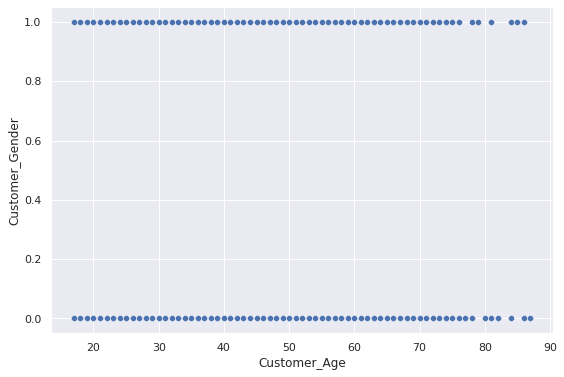

In [ ]:
# 52
sns.set(rc={"figure.figsize":(9, 6)})
sns.scatterplot(data=ALAGOZ_DF, y='Customer_Gender', x='Customer_Age')

## Histogram

Text(0.5, 0, 'Dolar')

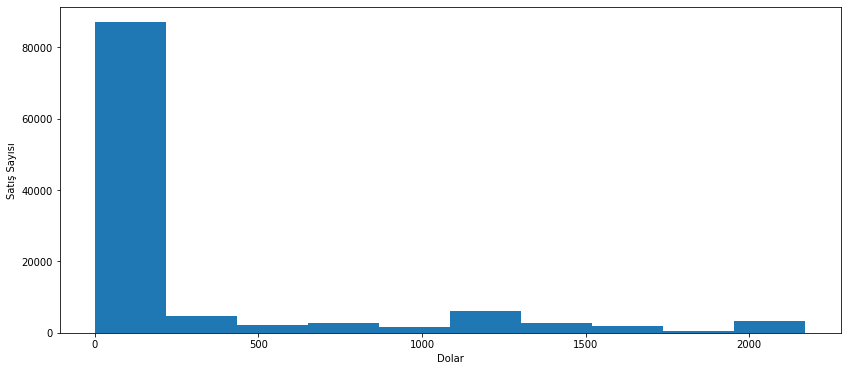

In [ ]:
# 53
ax = ALAGOZ_DF['Unit_Cost'].plot(kind='hist', figsize=(14,6))
ax.set_ylabel('Satış Sayısı')
ax.set_xlabel('Dolar')

## Bar Plot

Text(0, 0.5, 'Satış Sayısı')

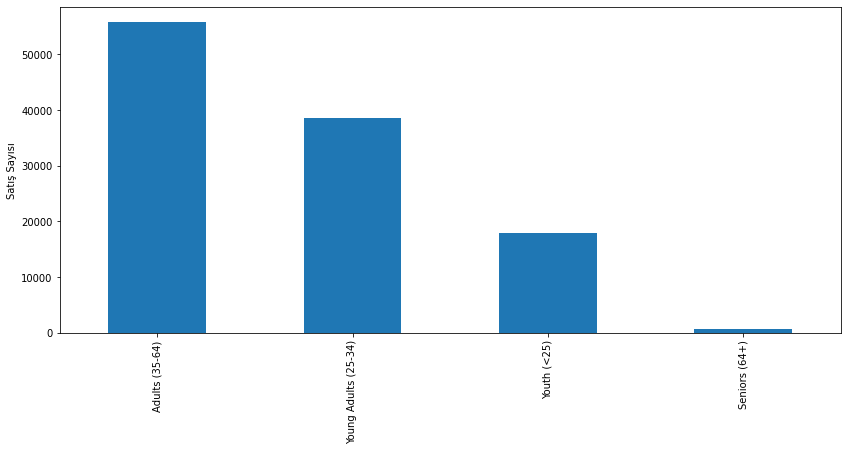

In [ ]:
# 54
ax = ALAGOZ_DF['Age_Group'].value_counts().plot(kind='bar', figsize=(14,6))
ax.set_ylabel('Satış Sayısı')

## Strip Plot

<AxesSubplot: xlabel='Order_Quantity', ylabel='State'>

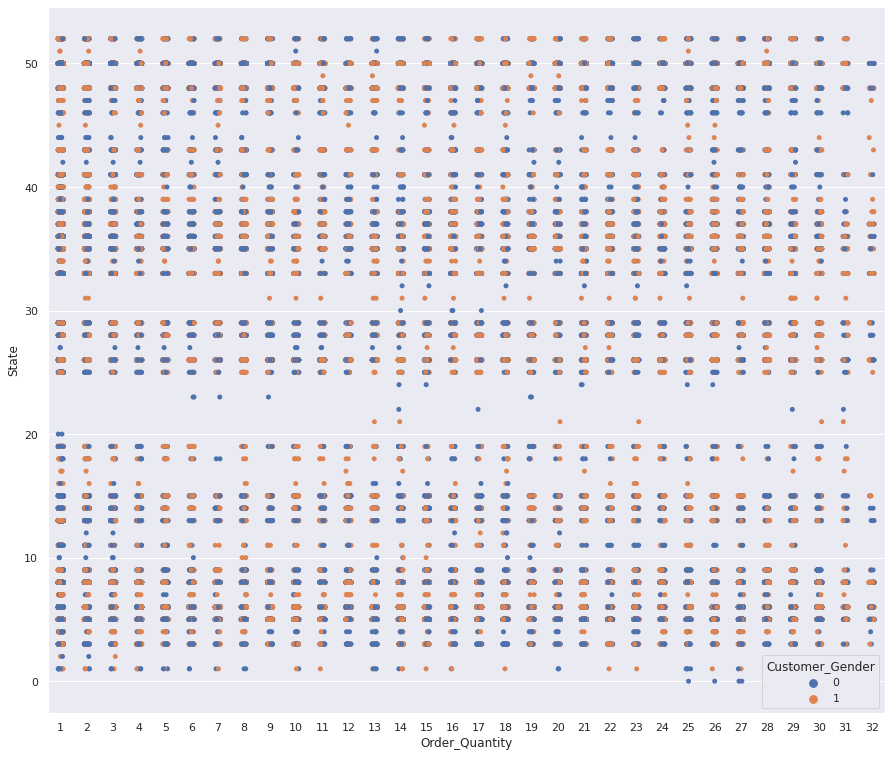

In [ ]:
# 57
sns.set(rc={"figure.figsize":(15, 13)})
sns.stripplot(data=ALAGOZ_DF, y ='State', x ='Order_Quantity', hue='Customer_Gender')

## Swarm Plot

<AxesSubplot: xlabel='Customer_Age', ylabel='Month'>

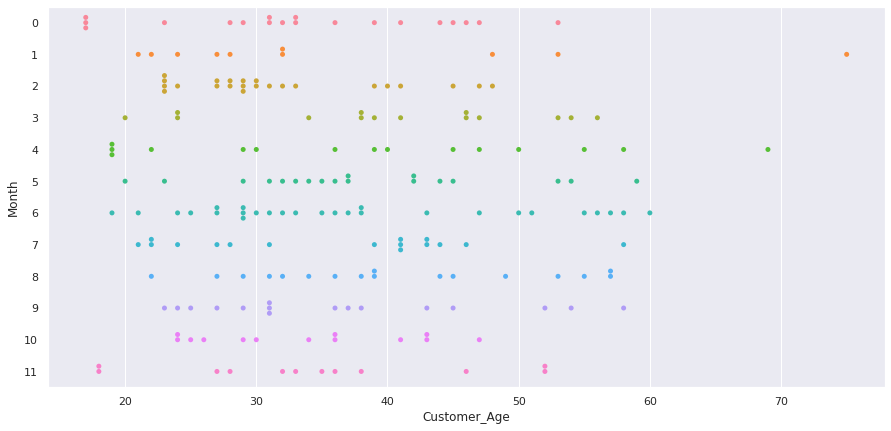

In [ ]:
# 58
ALAGOZ_DF2 = ALAGOZ_DF.sample(200)   # asıl veriden rastgele 200 veri aldık örneklem için
sns.set(rc={"figure.figsize":(15, 7)})  # grafiğin boyunu ayarladık
sns.swarmplot(data=ALAGOZ_DF2, y ='Month', x ='Customer_Age', orient="h")

## Pie Chart

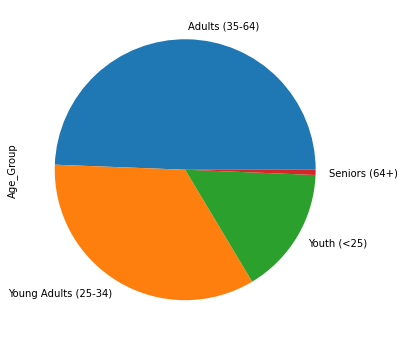

In [ ]:
# 55
ALAGOZ_DF['Age_Group'].value_counts().plot(kind='pie', figsize=(6,6))

## Heatmap

In [ ]:
# 56
corr = ALAGOZ_DF.corr()  # Sütunlar arasındaki ilişki ile heatmap oluşturulacak.
corr

,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
Day,1.000000,-0.005246,-0.007635,-0.014296,0.013176,0.014185,0.000351,0.006522,-0.003026,0.007178,-0.002940,-0.002412,0.003133,0.003207,0.004623,0.003329,0.003853
Month,-0.005246,1.000000,-0.071668,-0.004910,0.000168,-0.002507,-0.000619,-0.000828,-0.003098,0.004270,-0.001367,0.010627,-0.010298,-0.010052,-0.006322,-0.008499,-0.007937
Year,-0.007635,-0.071668,1.000000,0.040994,-0.037181,0.015592,0.022432,-0.015390,-0.086202,-0.044808,-0.016550,0.123169,-0.217575,-0.213673,-0.181525,-0.215604,-0.208673
Customer_Age,-0.014296,-0.004910,0.040994,1.000000,-0.834252,-0.021954,0.088634,-0.027047,-0.009001,-0.007976,-0.021209,0.026887,-0.021374,-0.020262,0.004319,-0.016013,-0.009326
Age_Group,0.013176,0.000168,-0.037181,-0.834252,1.000000,0.020559,-0.083621,0.026242,-0.004458,0.017311,0.020511,-0.010225,-0.010214,-0.010866,-0.023635,-0.008101,-0.013671
Customer_Gender,0.014185,-0.002507,0.015592,-0.021954,0.020559,1.000000,-0.007338,0.001788,0.001604,0.001531,-0.006084,0.010318,-0.015532,-0.015557,-0.005254,-0.010378,-0.008836
Country,0.000351,-0.000619,0.022432,0.088634,-0.083621,-0.007338,1.000000,-0.185978,-0.010513,-0.016257,0.007183,0.016551,-0.045101,-0.042755,0.013390,-0.042843,-0.024317
State,0.006522,-0.000828,-0.015390,-0.027047,0.026242,0.001788,-0.185978,1.000000,0.012594,0.013427,-0.002788,-0.026972,0.051668,0.051504,-0.098857,0.046600,-0.002777
Product_Category,-0.003026,-0.003098,-0.086202,-0.009001,-0.004458,0.001604,-0.010513,0.012594,1.000000,0.005815,-0.153537,-0.207852,0.307194,0.304656,0.240432,0.327113,0.304470
Sub_Category,0.007178,0.004270,-0.044808,-0.007976,0.017311,0.001531,-0.016257,0.013427,0.005815,1.000000,-0.128867,-0.123919,0.193457,0.187512,0.124073,0.150074,0.144459


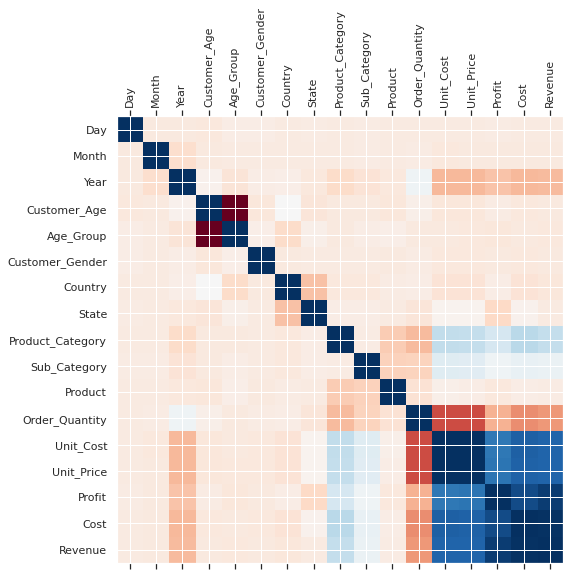

In [ ]:
# 56 devamı
fig = plt.figure(figsize=(8,8))  
plt.matshow(corr, cmap='RdBu', fignum=fig.number)
plt.xticks(range(len(corr.columns)), corr.columns, rotation='vertical');
plt.yticks(range(len(corr.columns)), corr.columns);

# Veriyi Farklı Uzantılarda Kaydetme

In [ ]:
# 42
ALAGOZ_DF.to_csv('https://raw.githubusercontent.com/nazlicanalagoz/VeriAnalizi_Proje/main/sales_data.csv')

In [ ]:
# 43
ALAGOZ_DF.to_excel('Datasets.xlsx')

In [ ]:
# 44
ALAGOZ_DF.to_html('Datasets.html')

In [ ]:
# 45
ALAGOZ_DF.to_json('Datasets.json')

In [ ]:
# 46
ALAGOZ_DF.to_csv('Datasets.txt')

# Pivot Table

In [ ]:
# 39
ALAGOZ_DF.pivot_table(index='Year', columns='Product_Category', aggfunc=np.sum)  # Bir sütundan tek indeksli pivot tablo oluşturuldu.

Age_Group                       Cost                        \
Product_Category         0       1       2          0          1          2   
Year                                                                          
2011                   NaN  3422.0     NaN        NaN  6083587.0        NaN   
2012                   NaN  3422.0     NaN        NaN  6223990.0        NaN   
2013               18476.0  7253.0  4845.0  1398984.0  6568377.0  1313468.0   
2014               22511.0  4278.0  4976.0  1778079.0  5019743.0  1490815.0   
2015               18476.0  7253.0  4845.0  1358414.0  9860156.0  1276858.0   
2016               22511.0  4278.0  4976.0  1720138.0  7507005.0  1450294.0   

                  Country                   Customer_Age  ...     State  \
Product_Category        0        1        2            0  ...         2   
Year                                                      ...             
2011                  NaN   6756.0      NaN          NaN  ...       NaN   
2012                  NaN   6756.0      NaN          NaN  ...       NaN   
2013              43143.0  15120.0  10586.0     535059.0  ...   79723.0   
2014              57313.0  13358.0  13713.0     730054.0  ...  100954.0   
2015              43143.0  15120.0  10586.0     535059.0  ...   79723.0   
2016              57313.0  13358.0  13713.0     730054.0  ...  100954.0   

                 Sub_Category                   Unit_Cost             \
Product_Category            0        1        2         0          1   
Year                                                                   
2011                      NaN  28832.0      NaN       NaN  3111995.0   
2012                      NaN  28832.0      NaN       NaN  3111995.0   
2013                 135480.0  64022.0  30051.0   97395.0  6568377.0   
2014                 179287.0  53016.0  37358.0  124370.0  5019743.0   
2015                 135480.0  64022.0  30051.0   97395.0  6568377.0   
2016                 179287.0  53016.0  37358.0  124370.0  5019743.0   

                           Unit_Price                        
Product_Category         2          0           1         2  
Year                                                         
2011                   NaN        NaN   5144835.0       NaN  
2012                   NaN        NaN   5144835.0       NaN  
2013               83904.0   260362.0  11076907.0  140403.0  
2014              101272.0   332338.0   8475942.0  168387.0  
2015               83904.0   260362.0  11076907.0  140403.0  
2016              101272.0   332338.0   8475942.0  168387.0  

[6 rows x 45 columns]

In [ ]:
# 40
ALAGOZ_DF.pivot_table(index=['Year','Month'], columns=['Product_Category','Sub_Category'])   # birden fazla sütundan çok indeksli pivot tablo oluşturuldu.

Cost                                           \
Product_Category Accessories                                            
Sub_Category      Bike Racks Bike Stands Bottles and Cages   Cleaners   
Year Month                                                              
2011 April               NaN         NaN               NaN        NaN   
     August              NaN         NaN               NaN        NaN   
     December            NaN         NaN               NaN        NaN   
     February            NaN         NaN               NaN        NaN   
     January             NaN         NaN               NaN        NaN   
...                      ...         ...               ...        ...   
2016 January      444.375000  281.384615         37.380090  42.136364   
     July         535.909091  218.300000         38.308880  40.883721   
     June         505.000000  327.181818         37.547945  47.187500   
     March        278.653846  299.214286         36.913747  46.315789   
     May          347.625000  292.318182         37.396619  45.933333   

                                                                          \
Product_Category                                                           
Sub_Category         Fenders     Helmets Hydration Packs Tires and Tubes   
Year Month                                                                 
2011 April               NaN         NaN             NaN             NaN   
     August              NaN         NaN             NaN             NaN   
     December            NaN         NaN             NaN             NaN   
     February            NaN         NaN             NaN             NaN   
     January             NaN         NaN             NaN             NaN   
...                      ...         ...             ...             ...   
2016 January      113.890110  188.214912      305.375000       55.342031   
     July         112.329897  181.734694      288.750000       51.874372   
     June         128.252632  190.318258      283.343284       57.523192   
     March        122.765432  188.966990      303.264706       59.238506   
     May          110.751220  185.566558      289.367647       56.294689   

                                              ...      Unit_Price  \
Product_Category          Bikes               ...     Accessories   
Sub_Category     Mountain Bikes   Road Bikes  ... Tires and Tubes   
Year Month                                    ...                   
2011 April          2045.682927  2357.277108  ...             NaN   
     August         2046.569231  2135.087963  ...             NaN   
     December       2208.486726  2368.271889  ...             NaN   
     February       2916.555556  2470.300654  ...             NaN   
     January        2705.305556  2401.006579  ...             NaN   
...                         ...          ...  ...             ...   
2016 January        1615.982063  1922.779070  ...        9.846262   
     July                   NaN          NaN  ...        9.121608   
     June           1572.358090  1874.054404  ...        9.909959   
     March          1552.736842  1541.323944  ...       10.820402   
     May            1495.412791  1603.490358  ...       10.064119   

                                                                            \
Product_Category          Bikes                            Clothing          
Sub_Category     Mountain Bikes   Road Bikes Touring Bikes     Caps Gloves   
Year Month                                                                   
2011 April          1932.195122  1982.132530           NaN      NaN    NaN   
     August         1912.046154  1826.638889           NaN      NaN    NaN   
     December       1976.867257  1863.069124           NaN      NaN    NaN   
     February       2458.555556  2016.777778           NaN      NaN    NaN   
     January        2232.833333  1966.578947           NaN      NaN    NaN   
...                         ...          ...     

# Rapor

In [ ]:
# 21
report = pandas_profiling.ProfileReport(ALAGOZ_DF)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Sweetviz Kütüphanesi

                                             |          | [  0%]   00:00 -> (? left)


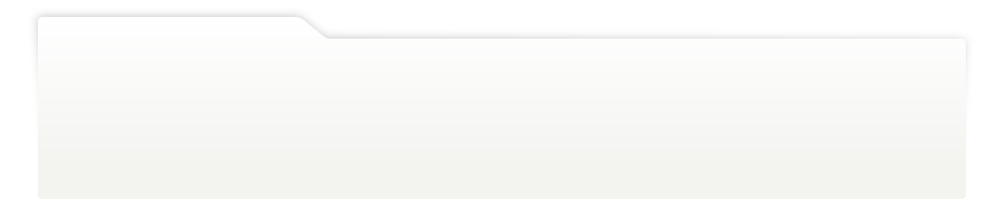
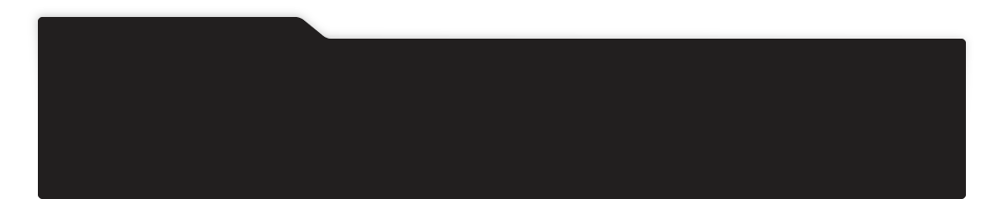
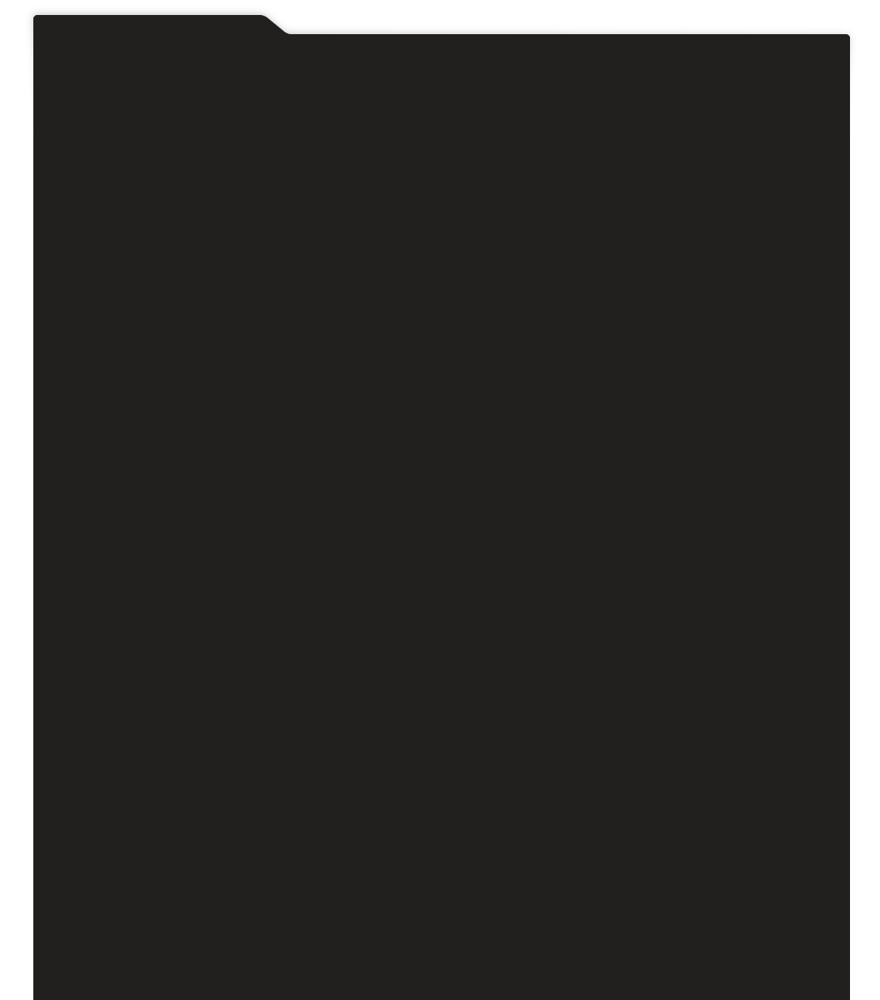
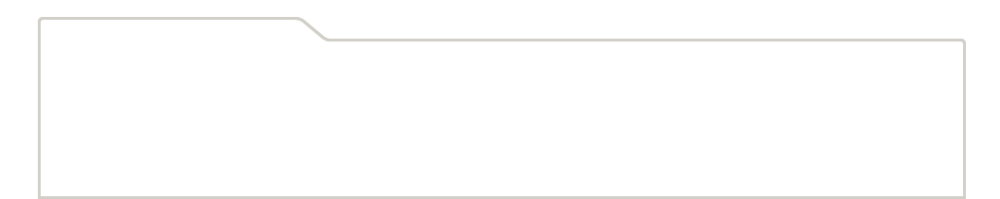
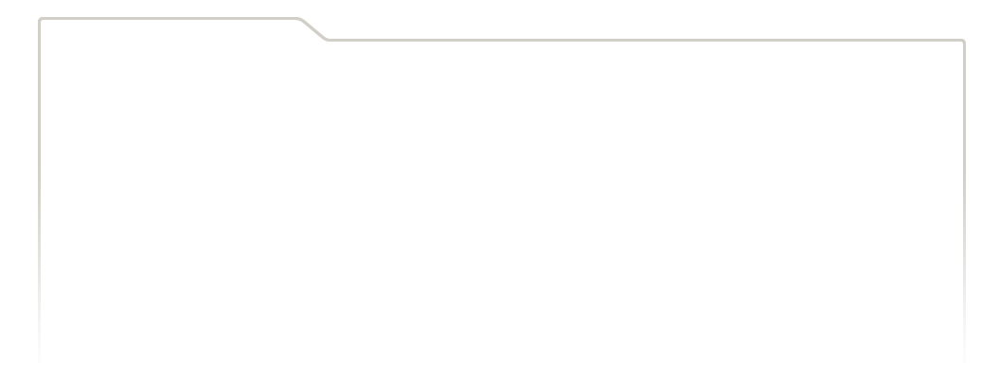
...
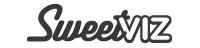
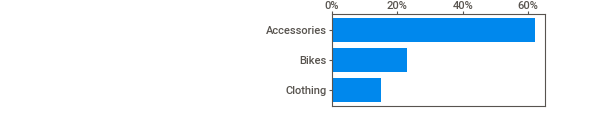
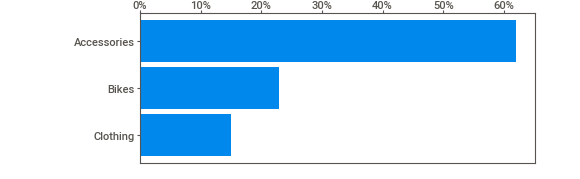
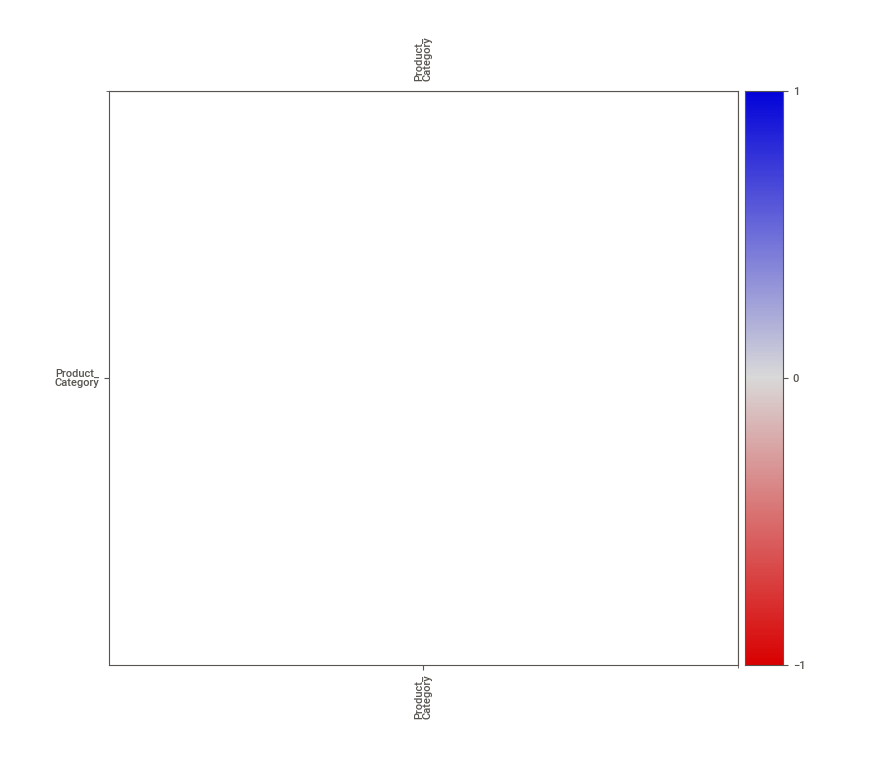
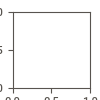

Report 'SWEETVIZ_REPORT.html' was saved to storage.


In [ ]:
# 63
# veri setini analiz edelim
my_report = sv.analyze(ALAGOZ_DF)

# raporu gösterelim
my_report.show_notebook( w=1500, 
                h=700, 
                scale=None,
                layout='widescreen',
                filepath='SWEETVIZ_REPORT.html')

# Dora Kütüphanesi

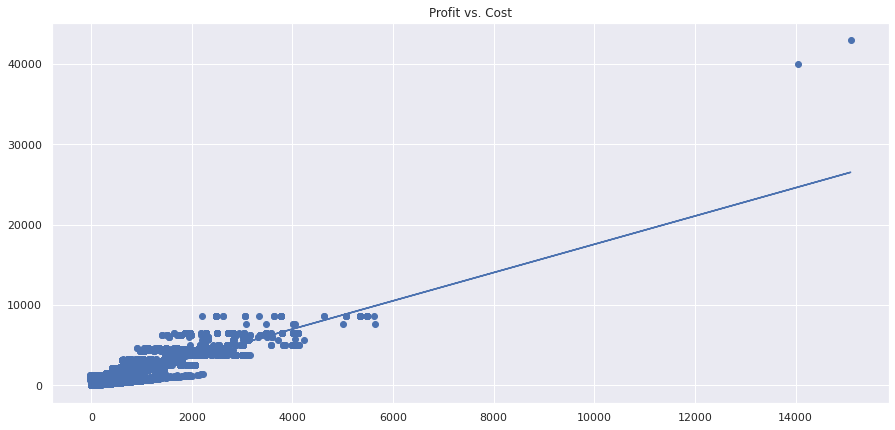

In [ ]:
# 64
dora = Dora()  #Intialize dora
ALAGOZ_DF = pd.read_csv("https://raw.githubusercontent.com/nazlicanalagoz/VeriAnalizi_Proje/main/sales_data.csv")  # veri setini okuduk
dora.configure(output = 'Cost', data = ALAGOZ_DF)   # loading the dataset
dora.plot_feature('Profit') #Visualizing Single Feature

# Bokeh Kütüphanesi

In [ ]:
# 65
ALAGOZ_DF.plot_bokeh.scatter(x='Revenue', y='Cost')

Figure(id='1824', ...)

In [ ]:
# 65 başka grafik
ALAGOZ_DF.plot_bokeh(kind='hist', title='Maliyet', y='Cost')

Figure(id='1975', ...)

# Dosya kopyalama ve Kontrol Etme

In [ ]:
# 22
kopya_df = ALAGOZ_DF.copy()
kopya_df

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113031,2016-04-12,12,April,2016,41,Adults (35-64),M,United Kingdom,England,Clothing,Vests,"Classic Vest, S",3,24,64,112,72,184
113032,2014-04-02,2,April,2014,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113033,2016-04-02,2,April,2016,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113034,2014-03-04,4,March,2014,37,Adults (35-64),F,France,Seine (Paris),Clothing,Vests,"Classic Vest, L",24,24,64,684,576,1260


In [ ]:
# 22 devamı
print(ALAGOZ_DF == kopya_df)

        Date   Day  Month  Year  Customer_Age  Age_Group  Customer_Gender  \
0       True  True   True  True          True       True             True   
1       True  True   True  True          True       True             True   
2       True  True   True  True          True       True             True   
3       True  True   True  True          True       True             True   
4       True  True   True  True          True       True             True   
...      ...   ...    ...   ...           ...        ...              ...   
113031  True  True   True  True          True       True             True   
113032  True  True   True  True          True       True             True   
113033  True  True   True  True          True       True             True   
113034  True  True   True  True          True       True             True   
113035  True  True   True  True          True       True             True   

        Country  State  Product_Category  Sub_Category  Product  \
0       

# CSV Dataset'ten sadece iki sütunu import etme

In [ ]:
# 61
ALAGOZ_DF = pd.read_csv("https://raw.githubusercontent.com/nazlicanalagoz/VeriAnalizi_Proje/main/sales_data.csv", usecols = ['Product_Category','Product'])
ALAGOZ_DF

,Product_Category,Product
0,Accessories,Hitch Rack - 4-Bike
1,Accessories,Hitch Rack - 4-Bike
2,Accessories,Hitch Rack - 4-Bike
3,Accessories,Hitch Rack - 4-Bike
4,Accessories,Hitch Rack - 4-Bike
...,...,...
113031,Clothing,"Classic Vest, S"
113032,Clothing,"Classic Vest, M"
113033,Clothing,"Classic Vest, M"
113034,Clothing,"Classic Vest, L"


# Modül oluşturarak çarpma ve toplama işlemi yaptırma

In [ ]:
# 62
num1 = int(input("İlk sayıyı giriniz: "))
num2 = int(input("İkinci sayıyı giriniz: "))

toplam = num1 + num2
carpim = num1 * num2

print("{} + {} = {}".format(num1, num2, toplam))
print("{} . {} = {}".format(num1, num2, carpim))

İlk sayıyı giriniz: 10
İkinci sayıyı giriniz: 3
10 + 3 = 13
10 . 3 = 30


# Dask, Vaex, Dataprep, PrettyPandas ve Datacleaner Kütüphaneleri

In [ ]:
# 66
df = dd.read_csv('https://raw.githubusercontent.com/nazlicanalagoz/VeriAnalizi_Proje/main/sales_data.csv')

In [ ]:
# 67
%%time
df = vaex.open('https://raw.githubusercontent.com/nazlicanalagoz/VeriAnalizi_Proje/main/sales_data.csv')


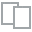
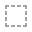
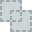
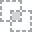
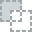
...
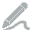
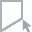
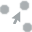
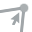
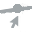

In [ ]:
# 68
df = load_dataset("wine-quality-red")
plot_correlation(df)
plot(df)

In [ ]:
# 69
PrettyPandas(df).total()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,class
0,7.400000,0.700000,0.000000,1.900000,0.076000,11.000000,34.000000,0.997800,3.510000,0.560000,9.400000,5.000000
1,7.800000,0.880000,0.000000,2.600000,0.098000,25.000000,67.000000,0.996800,3.200000,0.680000,9.800000,5.000000
2,7.800000,0.760000,0.040000,2.300000,0.092000,15.000000,54.000000,0.997000,3.260000,0.650000,9.800000,5.000000
3,11.200000,0.280000,0.560000,1.900000,0.075000,17.000000,60.000000,0.998000,3.160000,0.580000,9.800000,6.000000
4,7.400000,0.700000,0.000000,1.900000,0.076000,11.000000,34.000000,0.997800,3.510000,0.560000,9.400000,5.000000
5,7.400000,0.660000,0.000000,1.800000,0.075000,13.000000,40.000000,0.997800,3.510000,0.560000,9.400000,5.000000
6,7.900000,0.600000,0.060000,1.600000,0.069000,15.000000,59.000000,0.996400,3.300000,0.460000,9.400000,5.000000
7,7.300000,0.650000,0.000000,1.200000,0.065000,15.000000,21.000000,0.994600,3.390000,0.470000,10.000000,7.000000
8,7.800000,0.580000,0.020000,2.000000,0.073000,9.000000,18.000000,0.996800,3.360000,0.570000,9.500000,7.000000
9,7.500000,0.500000,0.360000,6.100000,0.071000,17.000000,102.000000,0.997800,3.350000,0.800000,10.500000,5.000000


In [ ]:
#70
my_clean_data = autoclean(ALAGOZ_DF)
ALAGOZ_DF.to_csv('my_clean_data.csv', sep=',', index=False)